# Preliminary analysis of BeamNetUS data on EOS using RPI/PARTOW integrated THz sensor

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from matplotlib import rc
from scipy.interpolate import interp1d
from scipy.integrate import quad 
from scipy.optimize import curve_fit

#plt.style.use('/home/ppiot/prlsinglecolumn.mplstyle')

### data on fiber laser test and timing 7/29 (monday)

In [3]:
dirname='./fiberlaser/'
fname= 'CT_Monday_SDFPD_2.npy'
data= np.load(dirname+fname,allow_pickle=True).item()
data

{'note': 'Ch1:BPM, Ch2:SD, Ch3 FPD',
 'AWAVXI11:Tek1:wf3': [array([0.1328, 0.1344, 0.1352, 0.1344, 0.1328, 0.1352, 0.136 , 0.1336,
         0.1336, 0.1352, 0.1344, 0.1336, 0.1336, 0.1344, 0.1336, 0.1336,
         0.1344, 0.1344, 0.132 , 0.1344, 0.1344, 0.1344, 0.1336, 0.1336,
         0.1344, 0.136 , 0.1328, 0.132 , 0.1328, 0.1344, 0.1344, 0.1336,
         0.1352, 0.1328, 0.1328, 0.1344, 0.1336, 0.1336, 0.1344, 0.1368,
         0.1352, 0.1352, 0.1344, 0.136 , 0.1336, 0.1344, 0.1336, 0.1344,
         0.1336, 0.1368, 0.1344, 0.136 , 0.132 , 0.1352, 0.1344, 0.1352,
         0.1352, 0.1328, 0.1344, 0.1336, 0.1328, 0.1352, 0.1344, 0.136 ,
         0.1336, 0.1352, 0.1328, 0.1344, 0.132 , 0.1352, 0.1344, 0.1352,
         0.1336, 0.1336, 0.1352, 0.1352, 0.1344, 0.1344, 0.1336, 0.1344,
         0.1352, 0.1352, 0.1344, 0.1336, 0.1336, 0.1352, 0.1368, 0.1336,
         0.1352, 0.1352, 0.1352, 0.1344, 0.1344, 0.1336, 0.1344, 0.1336,
         0.1344, 0.1352, 0.1352, 0.1352, 0.1344, 0.136 , 0.1352, 0

In [4]:
# find availale array in data
keys = data.keys()
print(keys)
print(np.shape(data['AWAVXI11:Tek1:wf2']))
t=np.array(data['AWAVXI11:Tek1:x'][:])
t=t-t[0]
print(len(t))

dict_keys(['note', 'AWAVXI11:Tek1:wf3', 'AWAVXI11:Tek1:wf3_ts', 'AWAVXI11:Tek1:wf2', 'AWAVXI11:Tek1:wf2_ts', 'AWAVXI11:Tek1:wf1', 'AWAVXI11:Tek1:wf1_ts', 'AWAVXI11:Tek1:x', 'AWAVXI11:Tek1:x_ts'])
(200, 1000)
200


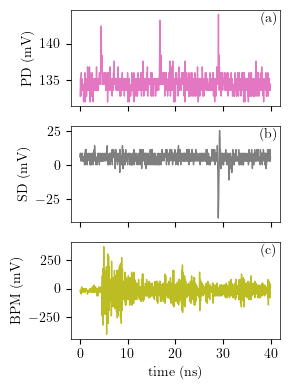

In [5]:
#plot one set of data in data['AWAVXI11:Tek1:wf2']      
f, (ax1, ax2, ax3) = plt.subplots(3,1, sharex=True, figsize=(3,4))

ax1.plot(data['AWAVXI11:Tek1:x'][0][:]*1e9, 1e3*data['AWAVXI11:Tek1:wf3'][0][:], 'C6')
ax2.plot(data['AWAVXI11:Tek1:x'][0][:]*1e9, 1e3*data['AWAVXI11:Tek1:wf2'][0][:], 'C7')
ax3.plot(data['AWAVXI11:Tek1:x'][0][:]*1e9, 1e3*data['AWAVXI11:Tek1:wf1'][0][:], 'C8')
ax3.set_xlabel('time (ns)')
ax1.set_ylabel('PD (mV)')
ax2.set_ylabel('SD (mV)')
ax3.set_ylabel('BPM (mV)')
# remove vertical space between subplots
plt.subplots_adjust(hspace=0.025)
# add a line at y=0


ax1.text(0.95, 0.905,'(a)', ha='center', va='center', transform=ax1.transAxes)
ax2.text(0.95, 0.905,'(b)', ha='center', va='center', transform=ax2.transAxes)
ax3.text(0.95, 0.905,'(c)', ha='center', va='center', transform=ax3.transAxes)

plt.tight_layout()
plt.savefig('coarsetiming.png', dpi=300, bbox_inches='tight', transparent  ='true')


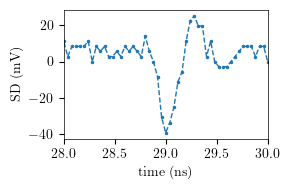

In [6]:
# make a single plot for ax2 only
f, ax2 = plt.subplots(1,1, figsize=(3,2))
ax2.plot(data['AWAVXI11:Tek1:x'][0][:]*1e9, 1e3*data['AWAVXI11:Tek1:wf2'][0][:], '.--')
ax2.set_xlabel('time (ns)')
ax2.set_ylabel('SD (mV)')
ax2.set_xlim(28,30)
plt.tight_layout()
plt.savefig('coarsetiming_SD.png', dpi=300, bbox_inches='tight', transparent  ='true')

In [8]:
dirname='Data_raw/July31_/'
fname= 'CoarseScan10nC_4_0.npz'
data1= np.load(dirname+fname)
data1   


NpzFile 'Data_raw/July31_/CoarseScan10nC_4_0.npz' with keys: x, BPDwf, ictwf, phase

In [9]:
# this is the phase in degreea
phase= data1['phase']
# this is the associated time delay in ps
phase_time_delay = phase / 81.25e6 / 360 * 1e12

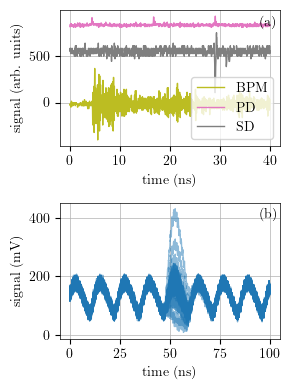

In [10]:
#plot one set of data in data['AWAVXI11:Tek1:wf2']      
f, (ax1, ax2) = plt.subplots(2,1, figsize=(3,4))

ax1.plot(data['AWAVXI11:Tek1:x'][0][:]*1e9, 1e3*data['AWAVXI11:Tek1:wf1'][0][:], 'C8', label='BPM')
ax1.plot(data['AWAVXI11:Tek1:x'][0][:]*1e9, 1e4*(data['AWAVXI11:Tek1:wf3'][0][:]-0.051), 'C6', label='PD')
ax1.plot(data['AWAVXI11:Tek1:x'][0][:]*1e9, 500+1e4*data['AWAVXI11:Tek1:wf2'][0][:], 'C7', label='SD'   )
ax1.legend(loc='lower right')
ax1.set_xlabel('time (ns)')
ax1.set_ylabel('signal (arb. units)')
ax1.grid()
# remove vertical space between subplots
# add a line at y=0
ax2.set_xlabel('time (ns)')
ax2.set_ylabel('signal (mV)')
for i in range(0, data1['BPDwf'].shape[0]):
    ax2.plot(1e9*data1['x'][0,:], 1e3*data1['BPDwf'][i,2,:], label='BPDwf', alpha=0.5, color='C0')
ax2.grid()

ax1.text(0.95, 0.905,'(a)', ha='center', va='center', transform=ax1.transAxes)
ax2.text(0.95, 0.905,'(b)', ha='center', va='center', transform=ax2.transAxes)

plt.tight_layout()
plt.savefig('timingandscan.png', dpi=300, bbox_inches='tight', transparent  ='true')

array([567. , 567.1, 567.2, 567.3, 567.4, 567.5, 567.6, 567.7, 567.8,
       567.9, 568. , 568.1, 568.2, 568.3, 568.4, 568.5, 568.6, 568.7,
       568.8, 568.9, 569. , 569.1, 569.2, 569.3, 569.4, 569.5, 569.6,
       569.7, 569.8, 569.9, 570. , 570.1, 570.2, 570.3, 570.4, 570.5,
       570.6, 570.7, 570.8, 570.9, 571. , 571.1, 571.2, 571.3, 571.4,
       571.5, 571.6, 571.7, 571.8, 571.9, 572. , 572.1, 572.2, 572.3,
       572.4, 572.5, 572.6, 572.7, 572.8, 572.9, 573. , 573.1, 573.2,
       573.3, 573.4, 573.5, 573.6, 573.7, 573.8, 573.9, 574. , 574.1,
       574.2, 574.3, 574.4, 574.5, 574.6, 574.7, 574.8, 574.9, 575. ,
       575.1, 575.2, 575.3, 575.4, 575.5, 575.6, 575.7, 575.8, 575.9,
       576. , 576.1, 576.2, 576.3, 576.4, 576.5, 576.6, 576.7, 576.8,
       576.9, 577. ])

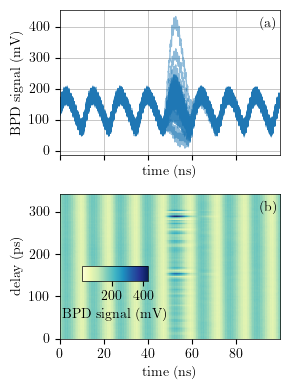

In [11]:
#combine the plot from ax2 above and the image plot into one figure
f, (ax1, ax2) = plt.subplots(2,1, figsize=(3,4), sharex=True)    
# have the same x axis for the two plots    
for i in range(0, data1['BPDwf'].shape[0]):
    ax1.plot(1e9*data1['x'][0,:], 1e3*data1['BPDwf'][i,2,:], label='BPDwf', alpha=0.5, color='C0')
ax1.set_xlabel('time (ns)')
ax1.set_ylabel('BPD signal (mV)')
ax1.grid()
im = ax2.imshow(1e3*data1['BPDwf'][:,2,:], aspect='auto', extent=[1e9*data1['x'][0,0], 1e9*data1['x'][0,-1], 0, phase_time_delay[-1]-phase_time_delay[0]], origin='lower', cmap='YlGnBu')
ax2.set_xlabel('time (ns)')
ax2.set_ylabel('delay (ps)')
ax1.text(0.95, 0.905,'(a)', ha='center', va='center', transform=ax1.transAxes)
ax2.text(0.95, 0.905,'(b)', ha='center', va='center', transform=ax2.transAxes)

# add color bar horizontalky within ax2
# scale the color bar to fit within ax2 reduce the size of the color bar
# add a colorbar to ax2 within the plot and make sure its scale is within 0.3 of the ax2 width
cbar_ax = ax2.inset_axes([0.1, 0.4, 0.3, 0.1])  # [x0, y0, width, height]  
cbar = plt.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('BPD signal (mV)')


#cbar = plt.colorbar(im, ax=ax2)
#cbar.set_label('BPD signal (mV)')
# share the same x axis
plt.tight_layout()
plt.savefig('BPDwf_combined.png', dpi=300, bbox_inches='tight', transparent  ='true')

### check data from July30th to plot a few traces


In [45]:
dirname='./July30_/'
fname= 'fiber_test_0730_CTRscrnOut.npz'
data= np.load(dirname+fname)
data

NpzFile './July30_/fiber_test_0730_CTRscrnOut.npz' with keys: x, BPDwf, phase

(601, 4, 5000)
(1, 5000)
[ 56.35874227 105.97624052   0.12558783]


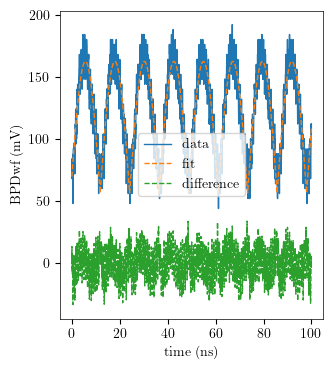

In [58]:
print(np.shape(data['BPDwf']))
print(np.shape(data['x']))
mV=1e3
t= 1e9*data['x'][0,:]
plt.plot (t,data['BPDwf'][0,2,:]*mV, label='data')
# fit a+b*abs(sin(2*pi*f*t+phi)) to the data
def fit_func(t, a, b, phi):
    f = 81.25e6*1e-9*0.5
    return a + b * np.abs(np.sin(2 * np.pi * f * t + phi))
# fit the data
popt, pcov = curve_fit(fit_func, t, data['BPDwf'][0,2,:]*mV, p0=[100, 50, 1])
# plot the fit
print(popt)
plt.plot(t, fit_func(t, *popt), label='fit', linestyle='--')
plt.plot(t, data['BPDwf'][0,2,:]*mV-fit_func(t, *popt), label='difference', linestyle='--')
plt.xlabel('time (ns)')
plt.ylabel('BPDwf (mV)')
plt.legend()


[ 61.54785801 109.87299607   0.66998226]
[ 62.12819321 109.3535123    0.67083796]
[ 62.25423115 108.43700802   0.67298313]
[ 61.35474726 108.52939221   0.67943944]
[ 61.08217132 109.04896148   0.68318523]
[ 61.37941417 110.79226186   0.67503391]
[ 62.6455271  110.23900401   0.67350879]
[ 62.22301565 112.01802926   0.68098018]
[ 62.23807782 108.81213544   0.68330235]
[ 61.87659153 108.60635392   0.68339084]
[ 61.79466691 109.38417006   0.68080847]
[ 61.79442908 109.36549273   0.68545035]
[ 62.69385951 110.66367272   0.67691572]
[ 62.43664813 110.42620687   0.68656894]
[ 62.52080491 107.61652298   0.69091892]
[ 61.72777836 108.61655137   0.68859029]
[ 61.9565555  109.92234234   0.6838326 ]
[ 62.2792492  110.20377949   0.6882891 ]
[ 62.52117534 109.66280122   0.6886248 ]
[ 62.13292116 108.7934204    0.68736461]
[ 61.94323026 109.7162864    0.68917694]
[ 61.42458317 110.3088406    0.69840377]
[ 61.46720981 109.6788838    0.69513171]
[ 61.90473315 107.18503234   0.70143283]
[ 61.28774295 11

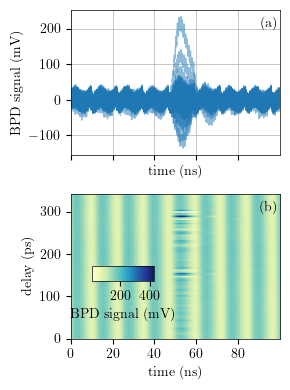

In [61]:
#combine the plot from ax2 above and the image plot into one figure
f, (ax1, ax2) = plt.subplots(2,1, figsize=(3,4), sharex=True)    
# have the same x axis for the two plots    
for i in range(0, data1['BPDwf'].shape[0]):
    popt, pcov = curve_fit(fit_func, t, data1['BPDwf'][i,2,:]*mV, p0=[100, 50, 1])
    print(popt)
    ax1.plot(1e9*data1['x'][0,:], 1e3*data1['BPDwf'][i,2,:]-fit_func(t, *popt), label='BPDwf', alpha=0.5, color='C0')
ax1.set_xlabel('time (ns)')
ax1.set_ylabel('BPD signal (mV)')
ax1.grid()
im = ax2.imshow(1e3*data1['BPDwf'][:,2,:], aspect='auto', extent=[1e9*data1['x'][0,0], 1e9*data1['x'][0,-1], 0, phase_time_delay[-1]-phase_time_delay[0]], origin='lower', cmap='YlGnBu')
ax2.set_xlabel('time (ns)')
ax2.set_ylabel('delay (ps)')
ax1.text(0.95, 0.905,'(a)', ha='center', va='center', transform=ax1.transAxes)
ax2.text(0.95, 0.905,'(b)', ha='center', va='center', transform=ax2.transAxes)

# add color bar horizontalky within ax2
# scale the color bar to fit within ax2 reduce the size of the color bar
# add a colorbar to ax2 within the plot and make sure its scale is within 0.3 of the ax2 width
cbar_ax = ax2.inset_axes([0.1, 0.4, 0.3, 0.1])  # [x0, y0, width, height]  
cbar = plt.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('BPD signal (mV)')


#cbar = plt.colorbar(im, ax=ax2)
#cbar.set_label('BPD signal (mV)')
# share the same x axis
plt.tight_layout()

### jitter data analysis (data of 7/30)

In [39]:
rstfine=np.load("./July31_/scan_coarse_573p8-578_0p025_CTR_2025_7_31_10_46.npy",allow_pickle=True).item()
jitterstat=np.load("./July31_/jitter_0Xing_2025_7_31_11_5.npy",allow_pickle=True).item()
print(rstfine.keys())
print(jitterstat.keys())

dict_keys(['peak', 'peak_pos', 'valley', 'valley_pos', 'phase'])
dict_keys(['peak', 'peak_pos', 'valley', 'valley_pos', 'phase'])


In [62]:
#print(np.shape(fine['phase']))
#print(fine['peak'])
# convert fine['peak'] to numpy array

fpeak2=[]
fpeak1=[]
indx=5
fine_pht=np.array(rstfine['phase'])/81.25e6/360*1e12
fine_ph=fine_pht-fine_pht[0]
fine_peak=rstfine['peak']

for i in range(len(fine_ph)):
    fpeak2.append(fine_peak[i][indx])
    fpeak1.append(fine_peak[i][indx-1])
fpeak1=np.array(fpeak1)
fpeak2=np.array(fpeak2)

AmplJitter=np.zeros(len(fine_ph))
for i in range(len(fine_ph)):
    AmplJitter[i]=fine_peak[i][indx-1]


#rint (stat_ph) 

total 1352
sd 0.7615185205490542
96.44400905932925 0.7615185205490542


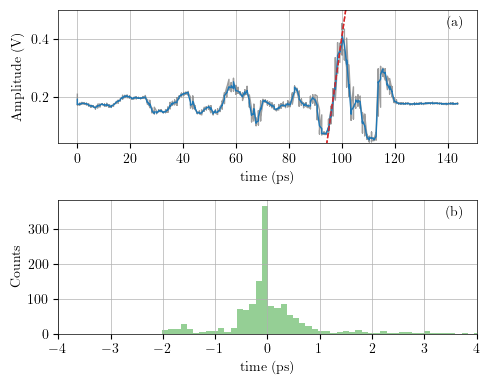

In [ ]:
F, (ax1, ax2) = plt.subplots(2,1, figsize=(5,4))


fpeak1_avg = np.array([np.mean(fpeak1[i:i+4]) for i in range(0, len(fpeak1), 4)])
fphase_avg = np.array([np.mean(fine_ph[i:i+4]) for i in range(0, len(fine_ph), 4)])

# do a polyfit on fpeak1_avg for value of fine_ph[::4] between 95 and 100
mask = (fine_ph[::4] > 95) & (fine_ph[::4] < 100)
coeffs = np.polyfit(fine_ph[::4][mask], fpeak1_avg[mask], 1)
fpeak1_fit = np.polyval(coeffs, fine_ph[::4])       
fpeak1_fit = np.polyval(coeffs, fine_ph[::4])
ax1.set_ylim(0.04,0.5)
#ax1.set_xlim(80, 120)
fpeak2_avg = np.array([np.mean(fpeak2[i:i+4]) for i in range(0, len(fpeak2), 4)])
ax1.plot(fine_ph,fpeak1,'C7', alpha=0.76, label='fpeak1')
ax1.plot(fine_ph[::4], fpeak1_fit, 'C3--', label='fpeak1 fit')
ax1.plot(fine_ph[::4],fpeak1_avg,'C0')
ax1.plot(fine_ph[::4], fpeak1_fit, 'C3--', label='fpeak1 fit')
ax1.set_xlabel('time (ps)')
ax1.set_ylabel('Amplitude (V)')
ax1.grid()

#AmplJitter= AmplJitter-96.54515510109754
# convert to ps 

coeffsInverse = np.polyfit(fpeak1_avg[mask], fine_ph[::4][mask], 1)
ax1.set_xlabel('time (ps)')
# Gaussian fie of the histogram
def gaussian(x, mu, sigma):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)
# Fit the histogram with a Gaussian
mu, sigma = np.mean(np.polyval(coeffsInverse, AmplJitter)), np.std(np.polyval(coeffsInverse, AmplJitter))
x_fit = np.linspace(np.min(np.polyval(coeffsInverse, AmplJitter)), np.max(np.polyval(coeffsInverse, AmplJitter)), 100)
y_fit = gaussian(x_fit, mu, sigma)
ax2.set_xlabel('time (ps)')
ax2.set_ylabel('Counts')
print ('total', len(AmplJitter))
ax2.hist(np.polyval(coeffsInverse, AmplJitter)-mu, bins=51, label='stat_peak', color='C2', alpha=0.5)    
#ax2.plot(x_fit-mu, y_fit, 'C3--', label='Gaussian fit')
#print standard deviation on plot np.std(np.polyval(coeffsInverse, AmplJitter))
print ('sd', np.std(np.polyval(coeffsInverse, AmplJitter)))

ax2.set_xlim(-4, 4)
print (mu, sigma)
ax1.text(0.95, 0.905,'(a)', ha='center', va='center', transform=ax1.transAxes)
ax2.text(0.95, 0.905,'(b)', ha='center', va='center', transform=ax2.transAxes)
ax2.grid()
plt.tight_layout()
plt.savefig('jitter.png', dpi=300, bbox_inches='tight', transparent  ='true')

In [77]:
# do a cubic spline interpolation of fine_ph[::4],fpeak1_avg and fine_ph[::4],fpeak2_avg
from scipy.interpolate import interp1d
fpeak1_avg = np.array([np.mean(fpeak1[i:i+4]) for i in range(0, len(fpeak1), 4)])
fphase_avg = np.array([np.mean(fine_ph[i:i+4]) for i in range(0, len(fine_ph), 4)])

fpeak1_spline = interp1d(fphase_avg, fpeak1_fit, kind='cubic')
# plot the spline interpolation
f, ax = plt.subplots(1,1, figsize=(5,4))    
ax.plot(fine_ph, fpeak1_spline(fine_ph), 'C0', label='fpeak1 spline')
ax.plot(fine_ph, fpeak2_spline(fine_ph), 'C1', label='fpeak2 spline')
ax.set_xlabel('time (ps)')
ax.set_ylabel('Amplitude (V)')
ax.grid()
ax.legend()
plt.tight_layout()


ValueError: Expect x to not have duplicates

In [82]:
print (fine_ph[1:30])


[0.         0.         0.         0.         0.         0.
 0.         0.85470085 0.85470085 0.85470085 0.85470085 0.85470085
 0.85470085 0.85470085 0.85470085 1.70940171 1.70940171 1.70940171
 1.70940171 1.70940171 1.70940171 1.70940171 1.70940171 2.56410256
 2.56410256 2.56410256 2.56410256 2.56410256 2.56410256]
